# Overview and Setup

The goal of this post is to implement DiffEdit, an algorithm that edits images using text prompts, proposed in the paper [DiffEdit: Diffusion-based semantic image editing with mask guidance](https://arxiv.org/pdf/2210.11427.pdf).
The following pair of images illustrates what the algorithm can do.
The image on the left is a real image from the [USDA's SNAP-Ed page on blackberries](https://snaped.fns.usda.gov/resources/nutrition-education-materials/seasonal-produce-guide/blackberries).
The image on the right was generated from the real image using DiffEdit and the indicated text prompts.

![](images/blackberries_and_blueberries.png)

Thanks go to Hugging Face for its wonderful [diffusers library](https://huggingface.co/docs/diffusers/index) used in this post and for its [tutorials on how to use the library](https://huggingface.co/docs/diffusers/using-diffusers/write_own_pipeline), which helped me a great deal.
Thanks also go to Jonathan Whitaker for his very helpful [deep dive notebook on Stable Diffusion](https://github.com/fastai/diffusion-nbs/blob/master/Stable%20Diffusion%20Deep%20Dive.ipynb), which I used as a source when creating this post.
Finally, thanks go to the authors of the DiffEdit paper, Guillaume Couairon, Jakob Verbeek, Holger Schwenk, and Matthieu Cord, for developing the algorithm and for the clear writing and explanations in their paper.

In [1]:
#| echo: false

# these imports are only used to make the table of package versions
import numpy
import matplotlib
import PIL
import cv2
import torch
import torchvision
import transformers
import diffusers
import sys
from IPython.display import Markdown
import pandas as pd

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

import torch
import torchvision.transforms as tfms
from transformers import (
    CLIPTokenizer,
    CLIPTextModel,
)
from diffusers import (
    DDPMScheduler,
    AutoencoderKL,
    UNet2DConditionModel
)

In [3]:
#| echo: false

package_list = [
    ('python',          sys.version.split()[0]),
    ('PyTorch',         torch.__version__),
    ('torchvision',     torchvision.__version__),
    ('matplotlib',      matplotlib.__version__),
    ('numpy',           numpy.__version__),
    ('PIL',             PIL.__version__),
    ('transformers',    transformers.__version__),
    ('diffusers',       diffusers.__version__),
]

Markdown(
    pd.DataFrame(package_list, columns=['Package', 'Version'])
      .to_markdown(index=False)
)

| Package      | Version      |
|:-------------|:-------------|
| python       | 3.9.16       |
| PyTorch      | 2.2.2+cu121  |
| torchvision  | 0.17.2+cu121 |
| matplotlib   | 3.8.4        |
| numpy        | 1.26.4       |
| PIL          | 10.3.0       |
| transformers | 4.39.3       |
| diffusers    | 0.27.2       |

# Outline of DiffEdit

The DiffEdit algorithm has three steps.

Step 1: Generate a Mask
: Generate a binary mask highlighting the portion of the image that we want to edit.

Step 2: Add Noise
: Add noise to the image using an inverse DDIM process as described in the paper [Denoising Diffusion Implicit Models](https://arxiv.org/pdf/2010.02502.pdf).

Step 3: Carefully Remove the Noise
: Remove the noise from the final noised image using a DDIM process as described in the same paper above, modified to make the edit that we want.

# Step 1: Generate a Mask

First, let's load our image.

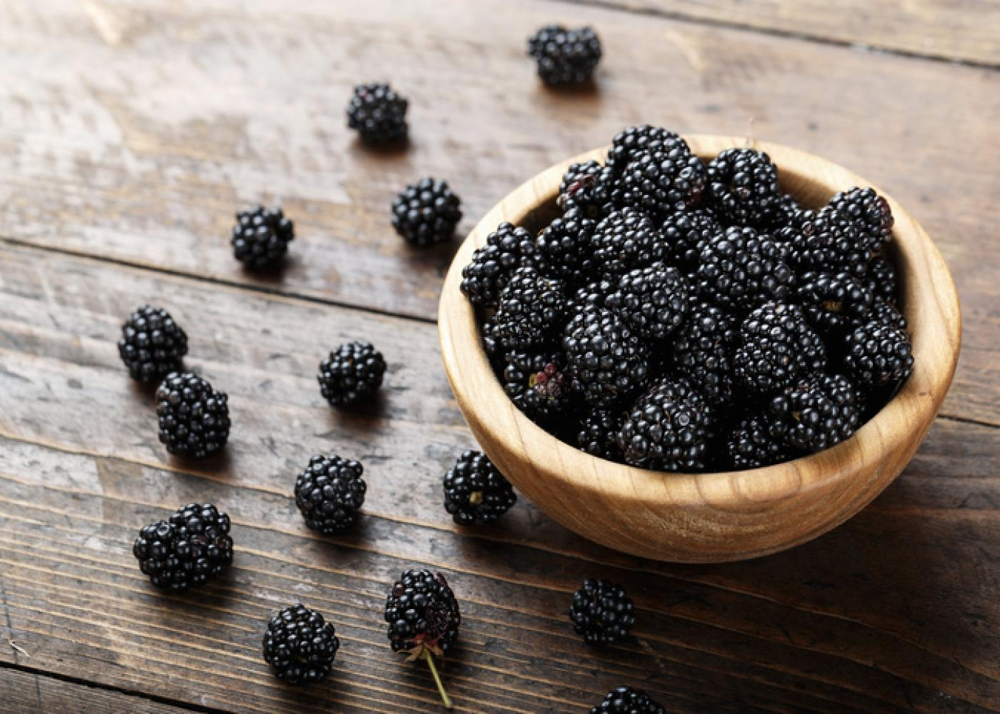

In [5]:
from diffusers.utils import load_image

image_path = "usda_images/blackberries.jpg"
sample_image = load_image(image_path)
sample_image

We'll generate our mask by adding noise to the image and then estimating the noise in two ways: once conditioned on a text prompt that accurately describes the image and once conditioned on a text prompt that reflects the edit we want to make.
First, let's load all of the models we'll need.

1. variational auto-encoder
2. scheduler
3. tokenizer
4. text encoder
5. U-Net

These components have all been pre-trained to work well together.

In [63]:
device = (
    "cuda" if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available()
    else "cpu"
)

checkpoint = "CompVis/stable-diffusion-v1-4"

vae = AutoencoderKL.from_pretrained(
    checkpoint, subfolder="vae", use_safetensors=True,
).to(device)

scheduler = DDPMScheduler.from_pretrained(
    checkpoint, subfolder="scheduler",
)

tokenizer = CLIPTokenizer.from_pretrained(
    checkpoint, subfolder="tokenizer",
)

text_encoder = CLIPTextModel.from_pretrained(
    checkpoint, subfolder="text_encoder", use_safetensors=True,
).to(device)

unet = UNet2DConditionModel.from_pretrained(
    checkpoint, subfolder="unet", use_safetensors=True,
).to(device)

Before we do anything, let's set the number of timesteps we want to use for our DDIM and inverse DDIM processes.
With the scheduler we're using, the number of timesteps can be anywhere from $1$ to $1000$.
The more timesteps we use, the better our outputs will be, but the longer it will take to generate those outputs.
We'll use $100$ timesteps, which will generate good results without taking too long.

In [7]:
scheduler.set_timesteps(100)

The editing process doesn't happen on the original image.
Instead, we work with a compressed version of the image called its *latent representation*.
The latent image is much smaller than the original, so the editing process is much faster.
The following utility functions convert back and forth between an image and its latent representation.

In [8]:
def image2latent(image, vae):
    image = tfms.ToTensor()(image)[None].to(device)
    with torch.no_grad():
        latent = vae.encode(image * 2 - 1)
    return 0.18215 * latent.latent_dist.sample()

def latent2image(latent, vae):
    latent = latent / 0.18215
    with torch.no_grad():
        image = vae.decode(latent).sample
    image = (image + 1) / 2
    image = image.clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    image = (image * 255).round().astype(np.uint8)
    image = Image.fromarray(image[0])
    return image

We'll add noise to the image (really, to its latent representation) using our scheduler's `add_noise()` method.

In [9]:
def add_noise_at_strength(latent, scheduler, strength=0.5):
    num_timesteps = len(scheduler.timesteps)
    target_timestep = num_timesteps - int(num_timesteps * strength)
    noise = torch.randn_like(latent)
    noisy_latent = scheduler.add_noise(
        latent, noise, scheduler.timesteps[target_timestep][None]
    )
    return noisy_latent, target_timestep

The `strength` parameter in the function can vary from $0$ to $1$ and controls how much noise we add.
Setting it to $0$ adds no noise, while setting it to $1$ replaces the entire latent with pure noise.
The DiffEdit paper recommends adding noise at strength $0.5$.
Let's see what that looks like when we convert the noised latent back to an image.

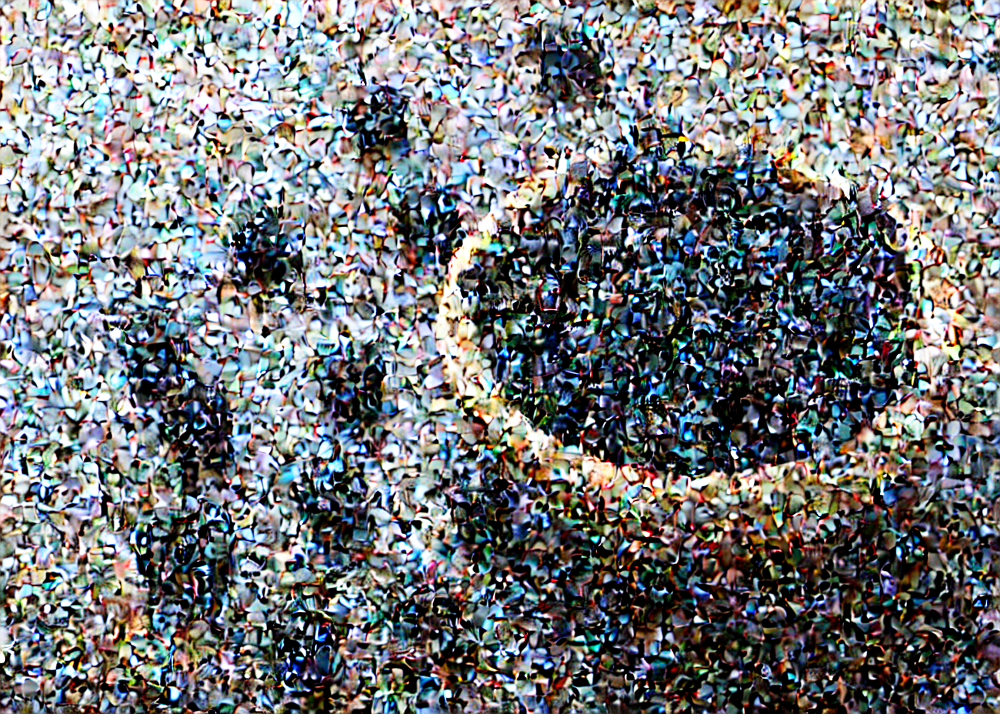

In [10]:
sample_latent = image2latent(sample_image, vae)
sample_noisy_latent, sample_timestep = add_noise_at_strength(
    sample_latent, scheduler, strength=0.5
)
latent2image(sample_noisy_latent, vae)

Now we'll define all of the other functions we need to generate the mask.
We need to

1. embed the text prompts
2. predict the noise
3. predict the difference in noise, averaged over 10 attempts for stability
4. generate the mask itself

In [35]:
def embed_prompt(prompt, tokenizer, text_encoder):
    # tokenize the input
    text_input = tokenizer(
        prompt,
        padding="max_length",
        max_length=tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt",
    ).to(device)

    # convert the tokenized text to embeddings
    with torch.no_grad():
        text_embedding = text_encoder(
            text_input.input_ids
        ).last_hidden_state
    
    # create the "unconditional embedding"
    max_length = text_input.input_ids.shape[-1] 
    unconditional_input = tokenizer(
        [""],
        padding="max_length",
        max_length=max_length,
        return_tensors="pt"
    ).to(device)
    with torch.no_grad():
        unconditional_embedding = text_encoder(
            unconditional_input.input_ids
        ).last_hidden_state
    
    # concatenate the embeddings for classifier-free guidance
    text_embedding = torch.cat(
        [unconditional_embedding, text_embedding]
    )

    return text_embedding

def predict_noise(
        latent,
        embedded_prompt,
        scheduler,
        timestep,
        unet,
        guidance_scale=7.5,
    ):
    # predict the noise
    t = scheduler.timesteps[timestep]
    latent_model_input = torch.cat([latent] * 2)
    latent_model_input = scheduler.scale_model_input(latent_model_input, t)
    with torch.no_grad():
        noise_pred = unet(
            latent_model_input, t, encoder_hidden_states=embedded_prompt
        )["sample"]
    
    # do classifier-free guidance
    noise_pred_unconditional, noise_pred_prompt = noise_pred.chunk(2)
    noise_pred = (
        noise_pred_unconditional
        + guidance_scale * (noise_pred_prompt - noise_pred_unconditional)
    )

    return noise_pred

def compute_average_noise_difference(
        latent,
        embedded_prompt_1,
        embedded_prompt_2,
        scheduler,
        timestep,
        unet,
        guidance_scale=7.5,
        num_iterations=10,
    ):
    result = []
    for _ in range(num_iterations):
        # predict noise for both prompts
        noise_1 = predict_noise(
            latent, embedded_prompt_1, scheduler, timestep, unet, guidance_scale
        )
        noise_2 = predict_noise(
            latent, embedded_prompt_2, scheduler, timestep, unet, guidance_scale
        )

        # compute the average absolute difference over latent channels
        noise_diff = (noise_1 - noise_2).abs().mean(dim=1)

        # remove extreme noise predictions
        upper_bound = noise_diff.mean() + noise_diff.std()
        noise_diff = noise_diff.clamp_max(upper_bound)

        result.append(noise_diff)
    
    # average the absolute differences for stability
    result = torch.cat(result).mean(dim=0)

    # rescale to the interval [0, 1]
    result = (result - result.min()) / (result.max() - result.min())

    return result

def generate_mask(
        image,
        vae,
        prompt_1,
        prompt_2,
        scheduler,
        tokenizer,
        text_encoder,
        unet,
        num_iterations=10,
        guidance_scale=7.5,
        strength=0.5,
    ):
    # convert image to YUV format to do histogram equalization
    image = np.array(image)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)

    # do histogram equalization
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))
    image[..., 0] = clahe.apply(image[..., 0])

    # convert image back to RGB format
    image = cv2.cvtColor(image, cv2.COLOR_YUV2RGB)
    image = Image.fromarray(image)

    # add noise
    latent = image2latent(image, vae)
    latent, timestep = add_noise_at_strength(latent, scheduler, strength=strength)

    # compute the mask
    embedded_prompt_1 = embed_prompt(prompt_1, tokenizer, text_encoder)
    embedded_prompt_2 = embed_prompt(prompt_2, tokenizer, text_encoder)
    noise_diff = compute_average_noise_difference(
        latent,
        embedded_prompt_1,
        embedded_prompt_2,
        scheduler,
        timestep,
        unet,
        guidance_scale,
        num_iterations
    )
    mask = postprocess_and_binarize(noise_diff)

    return mask

def postprocess_and_binarize(noise_diff, filter_size=15, threshold=0.3):
    # apply Gaussian blur to improve the quality of the mask
    noise_diff = noise_diff.cpu().numpy()
    noise_diff = cv2.GaussianBlur(noise_diff, (filter_size, filter_size), 0)
    
    # binarize and put on GPU
    mask = torch.from_numpy(noise_diff > threshold).long()
    mask = mask.to(device)

    return mask

Now we'll finally generate our mask.
Following the DiffEdit paper, we'll call the prompt that accurately descsribes the image the *reference text* and the prompt that reflects the edits we want to make the *query*.

In [36]:
reference_text = "A bowl of blackberries."
query = "A bowl of blueberries."

sample_mask = generate_mask(
    sample_image,
    vae,
    reference_text,
    query,
    scheduler,
    tokenizer,
    text_encoder,
    unet,
    guidance_scale=7.5,
    strength=0.5,
    num_iterations=10,
)

Let's see how we did.

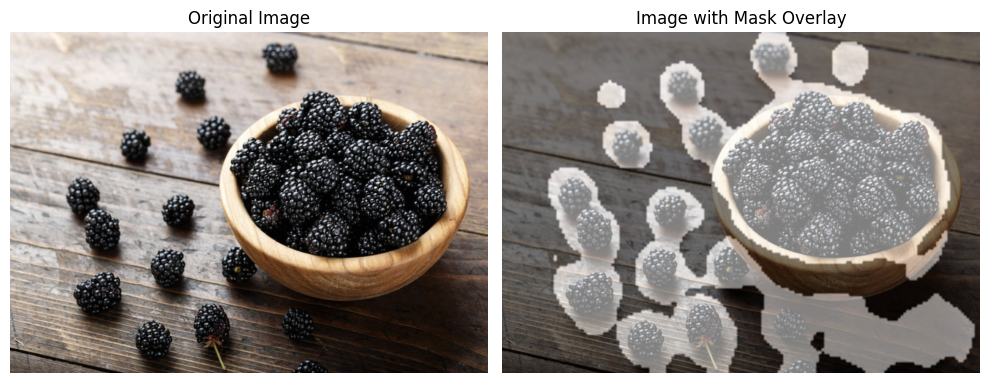

In [37]:
resized_mask = (sample_mask.cpu().numpy().astype(np.uint8)) * 255
resized_mask = Image.fromarray(resized_mask)
resized_mask = resized_mask.resize(sample_image.size)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
axs[0].imshow(sample_image)
axs[1].imshow(sample_image)
axs[1].imshow(resized_mask, cmap="Greys_r", alpha=0.5)
axs[0].set_axis_off()
axs[1].set_axis_off()
axs[0].set_title("Original Image")
axs[1].set_title("Image with Mask Overlay")
fig.tight_layout()
plt.show()

# Step 2: Add Noise

Now we'll add noise to our image with an inverse DDIM process.
We'll also save the intermediate noised latents for use in Step 3, where they'll help keep the edited image close to the original outside of the mask.

The inverse DDIM process uses the following equation (Equation 2 in [the DiffEdit paper](https://arxiv.org/pdf/2210.11427.pdf)).
I've changed the notation slightly to make it clear that it can be used to both add and remove noise.

$$ \mathbf x_{t + \Delta t} = \sqrt{\alpha_{t + \Delta t}} \left( \frac{\mathbf x_t - \sqrt{1 - \alpha_t} \epsilon_\theta(\mathbf x_t, t)}{\sqrt{\alpha_t}} \right) + \sqrt{1 - \alpha_{t + \Delta t}} \; \epsilon_\theta(\mathbf x_t, t)$$

Here, $t$ is a timestep in our inverse DDIM process, which we view as the current timestep, $t + \Delta t$ is the next timestep in the process, $\mathbf x_t$ is the partially noised latent at the current timestep, $x_{t + \Delta t}$ is the partially noised latent that we want to calculate for the next timestep, $\alpha_t$ is a coefficient that represents the amount of noise that should be in the latent at timestep $t$, and $\epsilon_\theta(\mathbf x_t, t)$ is the estimated noise in the latent at timestep $t$.

The timesteps $t$ and coefficients $\alpha_t$ are built into our scheduler object.
We'll compute the predicted noise $\epsilon_\theta$ using our pre-trained U-Net.

Now let's re-write the equation to simplify it a bit.
First, we can rearrange it to get

$$ \frac{\mathbf x_{t + \Delta t}}{\sqrt{\alpha_{t + \Delta t}}} = \frac{\mathbf x_t}{\sqrt{\alpha_t}} + \left( \sqrt{\frac{1 - \alpha_{t + \Delta t}}{\alpha_{t + \Delta t}}} - \sqrt{\frac{1 - \alpha_t}{\alpha_t}} \right) \epsilon_\theta(\mathbf x_t, t).$$

Then we can set $\beta_t = 1 - \alpha_t$ to get

$$ \frac{\mathbf x_{t + \Delta t}}{\sqrt{\alpha_{t + \Delta t}}} = \frac{\mathbf x_t}{\sqrt{\alpha_t}} + \left( \sqrt{\frac{\beta_{t + \Delta t}}{\alpha_{t + \Delta t}}} - \sqrt{\frac{\beta_t}{\alpha_t}} \right) \epsilon_\theta(\mathbf x_t, t).$$

Finally, we can set $\gamma_t = \sqrt{\beta_t / \alpha_t}$ and multiply both sides by $\sqrt{\alpha_{t + \Delta t}}$ to get

$$ \mathbf x_{t + \Delta t} = \sqrt{\frac{\alpha_{t + \Delta t}}{\alpha_t}} \, \mathbf x_t + \sqrt{\alpha_{t + \Delta t}} \left( \gamma_{t + \Delta t} - \gamma_t \right) \epsilon_\theta(\mathbf x_t, t),$$

which is the equation we'll use below.

In the inverse DDIM process, $\gamma_{t + \Delta t} - \gamma_t$ will be positive, so we'll add noise to the latent at every step.
In the regular DDIM process, the timesteps are reversed and $\gamma_{t + \Delta t} - \gamma_t$ will be negative, so we'll remove noise from the latent at every step.

In [38]:
def ddim_prep_timesteps(scheduler, encoding_ratio=0.5):
    timesteps = scheduler.timesteps
    num_timesteps = len(timesteps)
    target_timestep = num_timesteps - int(num_timesteps * encoding_ratio)
    timesteps = timesteps[target_timestep:]
    return timesteps

def ddim_noising(
        latent,
        scheduler,
        unet,
        tokenizer,
        text_encoder,
        encoding_ratio=0.5,
        guidance_scale=7.5
    ):
    results = []

    # embed the unconditional prompt and prep the timesteps
    embedding = embed_prompt("", tokenizer, text_encoder)
    timesteps = ddim_prep_timesteps(scheduler, encoding_ratio=encoding_ratio)
    timesteps = reversed(timesteps)

    # prep the alphas and assemble a generator of consecutive pairs
    alphas = scheduler.alphas_cumprod[timesteps]
    alphas = torch.cat([alphas.new_tensor([1.0]), alphas])
    alpha_pairs = zip(alphas[:-1], alphas[1:])

    for t, (alpha_t, alpha_t_plus_delta_t) in zip(timesteps, alpha_pairs):
        # compute the unconditional noise
        latent_model_input = torch.cat([latent] * 2)
        with torch.no_grad():
            noise_pred = unet(
                latent_model_input, t, encoder_hidden_states=embedding
            ).sample
        noise_pred_unconditional, noise_pred_prompt = noise_pred.chunk(2)
        noise_pred = (
            noise_pred_unconditional
            + guidance_scale * (noise_pred_prompt - noise_pred_unconditional)
        )

        # compute the coefficients in the DDIM equation
        beta_t = 1 - alpha_t
        beta_t_plus_delta_t = 1 - alpha_t_plus_delta_t
        gamma_t = (beta_t / alpha_t).sqrt()
        gamma_t_plus_delta_t = (beta_t_plus_delta_t / alpha_t_plus_delta_t).sqrt()

        # add noise to the latent using the DDIM equation
        latent = (
            (alpha_t_plus_delta_t / alpha_t).sqrt() * latent
            + alpha_t_plus_delta_t.sqrt() * (gamma_t_plus_delta_t - gamma_t) * noise_pred
        )

        results.append(latent)

    return results

In [39]:
sample_noised_latents = ddim_noising(
    sample_latent,
    scheduler,
    unet,
    tokenizer,
    text_encoder,
    encoding_ratio=0.8,
    guidance_scale=7.5,
)

Let's see what some of these partially noised latents look like.

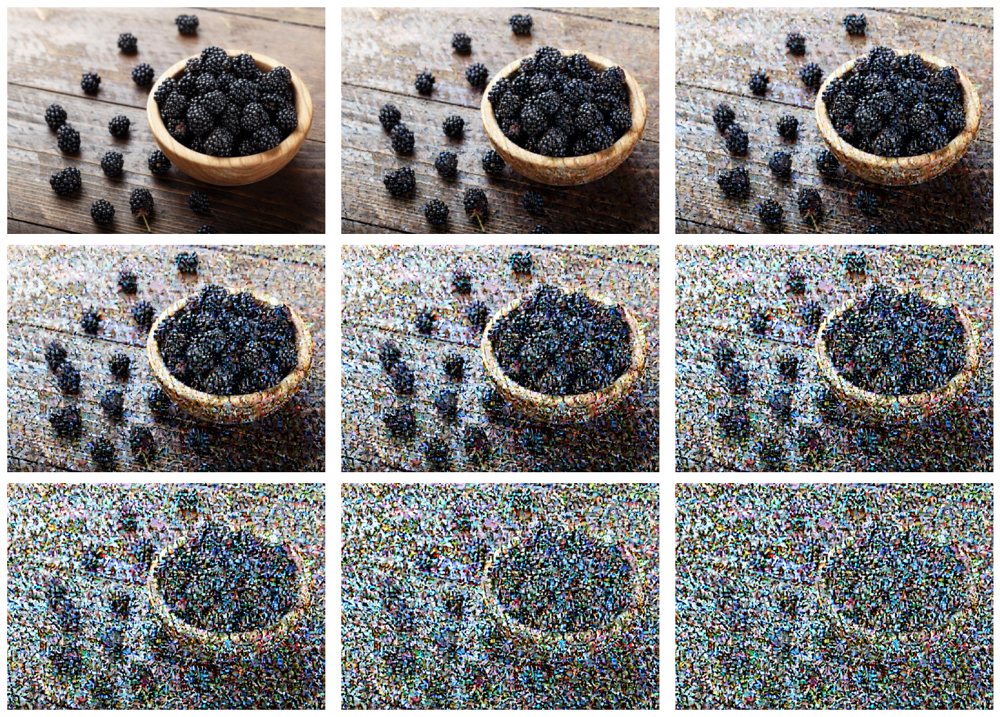

In [56]:
latents_to_show = sample_noised_latents[9::10]
latents_to_show = [sample_latent] + latents_to_show
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(14, 10))

for noised_latent, ax in zip(latents_to_show, axs.flat):
    noised_image = latent2image(noised_latent, vae)
    ax.imshow(noised_image)
    ax.set_axis_off()

fig.tight_layout()
plt.show()

# Step 3: Carefully Remove the Noise

Now we'll remove the noise from our saved noised latents while conditioning on the query, which at each step will push the portion of the image highlighted by the mask towards the edit that we want.
We'll use the same equation for the DDIM process that we used for the inverse process, just reversing the sequence of timesteps $t$.
At each step, we'll also replace the pixels not highlighted by the mask with the pixels from the corresponding partially noised image from Step 2, reducing the chance that the algorithm makes stray edits to the image.

In [53]:
def ddim_guided_denoising(
        noised_latents,
        mask,
        prompt,
        scheduler,
        unet,
        tokenizer,
        text_encoder,
        encoding_ratio=0.5,
        guidance_scale=7.5,
    ):
    # prep the list of partially noised latents
    # we'll need the original latent without noise for the last step
    noised_latents = list(reversed(noised_latents)) + [sample_latent]

    # we start with the most noised latent
    latent = noised_latents[0]

    # embed the query and prep the timesteps
    embedding = embed_prompt(prompt, tokenizer, text_encoder)
    timesteps = ddim_prep_timesteps(scheduler, encoding_ratio=encoding_ratio)

    # prep the alphas and assemble a generator of consecutive pairs
    alphas = scheduler.alphas_cumprod[timesteps]
    alphas = torch.cat([alphas, alphas.new_tensor([1.0])])
    alpha_pairs = zip(alphas[:-1], alphas[1:])

    loop_data = zip(timesteps, noised_latents, alpha_pairs)
    for t, prev_latent, (alpha_t, alpha_t_plus_delta_t) in loop_data:
        # compute the noise conditioned on the query
        latent_model_input = torch.cat([latent] * 2)
        with torch.no_grad():
            noise_pred = unet(
                latent_model_input, t, encoder_hidden_states=embedding
            ).sample
        noise_pred_unconditional, noise_pred_prompt = noise_pred.chunk(2)
        noise_pred = (
            noise_pred_unconditional
            + guidance_scale * (noise_pred_prompt - noise_pred_unconditional)
        )

        # compute the coefficients in the DDIM equation
        beta_t = 1 - alpha_t
        beta_t_plus_delta_t = 1 - alpha_t_plus_delta_t
        gamma_t = (beta_t / alpha_t).sqrt()
        gamma_t_plus_delta_t = (beta_t_plus_delta_t / alpha_t_plus_delta_t).sqrt()

        # remove noise from the latent using the DDIM equation
        latent = (
            (alpha_t_plus_delta_t / alpha_t).sqrt() * latent
            + alpha_t_plus_delta_t.sqrt() * (gamma_t_plus_delta_t - gamma_t) * noise_pred
        )

        # replace pixels outside of the mask with those from the previous noised latent
        # helps limit stray edits to the original image
        latent = mask * latent + (1 - mask) * prev_latent

    return latent

In [55]:
edited_sample_latent = ddim_guided_denoising(
    sample_noised_latents,
    sample_mask,
    query,
    scheduler,
    unet,
    tokenizer,
    text_encoder,
    encoding_ratio=0.8,
    guidance_scale=7.5,
)

Let's see how we did.

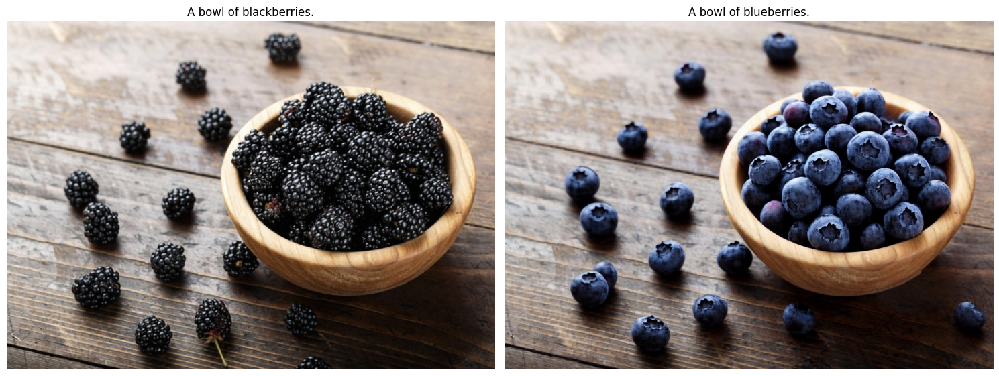

In [70]:
edited_sample_image = latent2image(edited_sample_latent, vae)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))
axs[0].imshow(sample_image)
axs[1].imshow(edited_sample_image)
axs[0].set_axis_off()
axs[1].set_axis_off()
axs[0].set_title(reference_text)
axs[1].set_title(query)
fig.tight_layout()
plt.show()

We've recovered the figure from the beginning of the post!